# Segmentation d'Image

## Chan, Esedoglu et Nikolova : formulation convexe
(d'après la partie 3 du TP de Nicloas Papadakis [TP2_Papadakis](https://www.math.u-bordeaux.fr/%7Enpapadak/TP/TP2.pdf) )

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
plt.close('all')
from scipy import misc 
from scipy.interpolate import RectBivariateSpline
from PIL import Image
import holoviews as hv
import param
import panel as pn
from panel.pane import LaTeX
hv.extension('bokeh')
import warnings
warnings.filterwarnings('ignore')
import requests
from PIL import Image
from io import BytesIO
import plotly.express as px
from bokeh.plotting import show

### Importation de l'image

In [2]:
img = np.array( Image.open('coins.png') )[:,:,0] 
options = dict(cmap='gray',xaxis=None,yaxis=None,width=400,height=400,toolbar=None)

In [3]:
hv.Image(img).opts(**options)

:Image   [x,y]   (z)

In [4]:
img = img.astype('float64') #le type de base de l'image n'autorise que des valeurs entre 0 et 255

### Fonctions Grad et Div

Fonctions qui calculent les gradients et divergents d'images 2D

In [5]:
#Gradient d'une image
#Divergence d'un gradient d'image

def GradientHor(x):
    y=x-np.roll(x,1,axis=1)
    y[:,0]=0
    return y
def GradientVer(x):
    y=x-np.roll(x,1,axis=0)
    y[0,:]=0
    return y
def DivHor(x):
    N=len(x[0])
    y=x-np.roll(x,-1,axis=1)
    y[:,0]=-x[:,1]
    y[:,N-1]=x[:,N-1]
    return y
def DivVer(x):
    N=len(x)
    y=x-np.roll(x,-1,axis=0)
    y[0,:]=-x[1,:]
    y[N-1,:]=x[N-1,:]
    return y
def Gradient(x):
    y=[]
    y.append(GradientHor(x))
    y.append(GradientVer(x))
    return y
def Div(y):
    x=DivHor(y[0])+DivVer(y[1])
    return x

### Autres fonctions utiles

Projection sur l'ensemble convexe $[0,1]$ i.e $P_{[0,1]}(u)=min(max(u,0),1)$

In [6]:
#projection
def PA(u):
    return np.clip(u,0,1)

La norme régularisée $\lVert\nabla\phi\rVert_\epsilon = \sqrt{\phi_x^2+\phi_y^2+\epsilon^2}$

In [7]:
#norme epsilon
def normE(grad,E):
    return np.sqrt(grad[0]**2+grad[1]**2+E**2) #sqrt et **2 fonctionnent éléments par éléments

La fonction énergie qu'on cherche à minimiser :
$(u^*,c_1^*,c_2^*) = \underset{\substack{u\in[0,1] \\ c_1 \in [0,255] \\ c_2 \in [0,255]}}{\operatorname{argmin}} \int_{\Omega}\|\nabla u\|_\epsilon +\lambda \int_{\Omega}\left|I(x)-c_1\right|^2 u(x) d x +\lambda \int_{\Omega}\left|I(x)-c_2\right|^2(1-u(x)) d x$

Pour la suite, on considère qu'on calcule $\left(I-c_1\right)^2$ et $\left(I-c_2\right)^2$ avant le début de l'algorithme

In [8]:
#energy function
def compute_energy_smooth(u,Ic1sqr,Ic2sqr,l,e):
    I1 = np.sum(normE(Gradient(u),e))
    I2 = l*np.sum(Ic1sqr*u)
    I3 = l*np.sum(Ic2sqr*(1-u))
    return I1+I2+I3

Une itération de descente de gradient projeté de la forme :
$u_{k+1} = P_{[0,1]}\left(u_k + \tau\left(div\left(\frac{\nabla u_k}{\|\nabla u_k\|_\epsilon}\right) - \lambda(I-c_1)^2 + \lambda(I-c_2)^2\right)\right)$

avec le pas $\tau$

In [9]:
#Calcul une itération
def iteration(u0,l,e,tau,Ic1sqr,Ic2sqr):
    grad = Gradient(u0)
    u1 = PA(u0 + tau*(Div(grad/(normE(grad,e))) - l*Ic1sqr + l*Ic2sqr)) #/ divise bien éléments par éléments les listes de matrices
    return u1
    #Affichage u1

### Descente de gradient et seuillage

Enfin l'algorithme de descente de gradient utilisant l'itération précédamment définie.
On lui passe en argument l'image à seuiller $I$, les coefficients $c_1,c_2,\lambda,\epsilon$, le pas fixe $\tau$. On passe également la solution initiale $u_0$ en argument pour pouvoir étudier ses effets par la suite. Et enfin la tolérance de convergence ```th``` et le nombre maximum d'itérations ```Niter```.

On calcule également la fonctionnelle à chaque étape. Les sorties sont la solution optimisée et la fonctionnelle.

In [18]:
#Descente de gradient : retourne la solution et la valeur de la fonctionnelle 
def proj_gradient_descent(I,c1,c2,lam,E,tau,u0,th,Niter,affichage=True):
    Ic1sqr = (I-c1)**2
    Ic2sqr = (I-c2)**2

    uk = u0
    f = [compute_energy_smooth(uk,Ic1sqr,Ic2sqr,lam,E)]

    iter = 0
    delta= np.inf 
    while delta>th and iter<Niter :
        ukp1 = iteration(uk,lam,E,tau,Ic1sqr,Ic2sqr)
        #Affichage u1
        if iter%20==0 and affichage:
            show(hv.render(hv.Image(ukp1).opts(**options)))
        #Calcul pour CV
        delta =np.linalg.norm(ukp1-uk)
        uk=ukp1
        f.append(compute_energy_smooth(uk,Ic1sqr,Ic2sqr,lam,E))
        iter+=1
    show(hv.render(hv.Image(uk).opts(**options)))
    return uk,f

 La solution $u^*$ renvoyée par l'algorithme précédent est continue, et prenant des valeurs entre 0 et 1. Pour la segmentation discrète que nous souhaitons, il faut seuiller la fonction. On chosit un seuil de seuillage $\mu$

In [19]:
#Seuillage de la solution pour segmentation
def seuillage(u,mu):
    uk = np.copy(u)
    uk[uk<mu]=0
    uk[uk>mu]=255
    return uk

### Test sur l'image

In [25]:
#Paramètres
lam = 10**(-4)
tau = 0.1
mu = 0.5
E = 1
I =img
c1 = 110 
c2 =227
th=1e-3#seuil de CV
Niter=100

#Initialisation
u0 = np.ones(np.shape(I))

In [26]:
sol,f = proj_gradient_descent(I,c1,c2,lam,E,tau,u0,th,Niter,affichage=False)

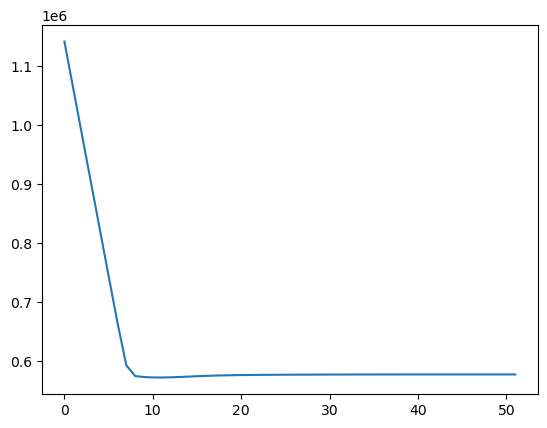

In [27]:
plt.plot(f)

In [28]:
segmentation = seuillage(sol,mu)
hv.Image(segmentation).opts(**options)

:Image   [x,y]   (z)

### Tests de paramètres

In [ ]:
EArray = np.array([1])
lamArray = np.array([10**(-4),10**(-4.1)])

In [ ]:
UK =[]
for lam in lamArray:
    for E in EArray:
        print(lam,E)
        #gradient projeté
        mu=.5
        tau = 0.1
        I =img
        c1 = 110 
        c2 =227 #à changer
        th=80
        N=200
        
        Ic1sqr = (I-c1)**2
        Ic2sqr = (I-c2)**2

        u0 = np.ones((658,843))

        uktmp =np.ones((658,843))
        uk = u0

        # for i in range (N):
        
        Delta =th+1
        iterN=0
        energy = [compute_energy_smooth(uk,Ic1sqr,Ic2sqr,lam,E)]
        while(Delta>th):
            grad = Gradient(uk)
            #gradient projeté
            ukp1 = PA(uk + tau*(Div(grad/(normE(grad,E))) - lam*(I-c1)**2 - lam*(I-c2)**2))
            #Affichage u1
            if (iterN==0):
                show(hv.render(hv.Image(ukp1).opts(**options)))
            #Calcul pour CV
            Delta =np.linalg.norm(ukp1-uk)
            uk=ukp1
            energy.append(compute_energy_smooth(uk,Ic1sqr,Ic2sqr,lam,E))
            iterN+=1
        #Affichage uK qui a CV
        show(hv.render(hv.Image(uk).opts(**options)))
        #Affichage 
        uk[uk<mu]=0
        uk[uk>mu]=255
        show(hv.render(hv.Image(uk).opts(**options)))
        fig= plt.plot(energy)
        plt.show()
        UK += [uk]